# Self-Driving Car Engineer Nanodegree

## Project: **Advanced Lane Finding**

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.patches import Polygon

%matplotlib inline

## Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

### Explore chessboard image
We need to find corners in one row and colume for camera calibration

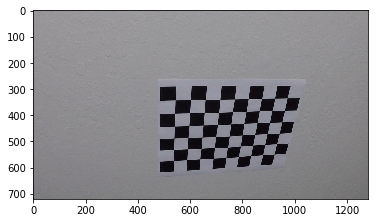

In [2]:
img = mpimg.imread('camera_cal/calibration10.jpg')
plt.imshow(img)

We found that there are 9 corners in one row and 6 corners in one column.

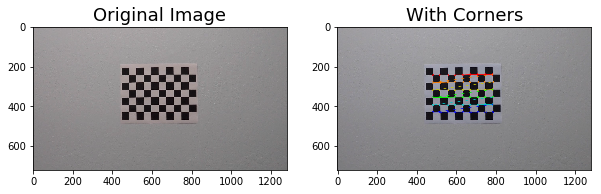

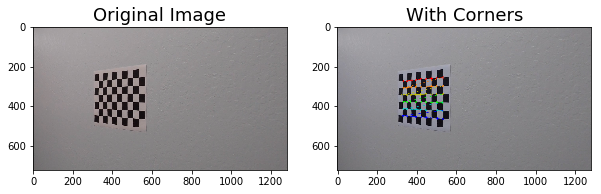

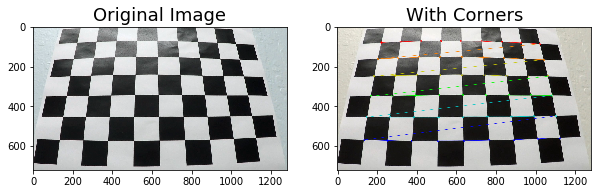

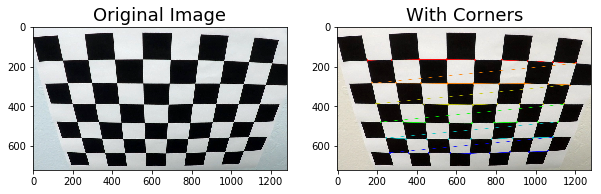

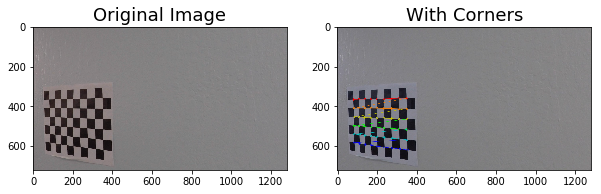

...

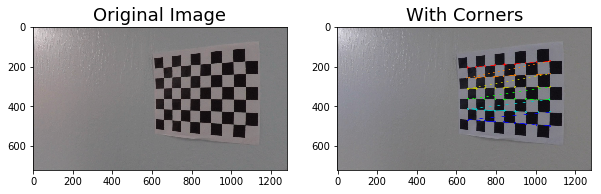

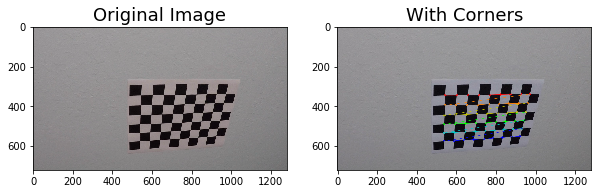

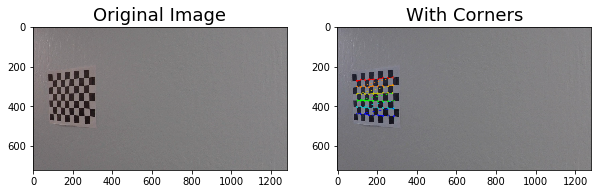

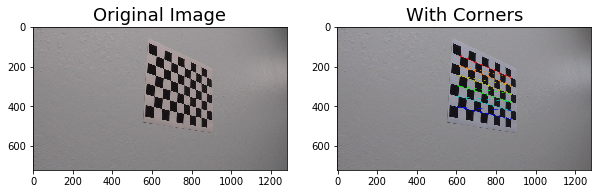

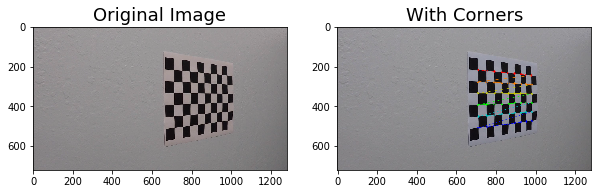

In [3]:
row_corner = 9  ## corners in one row
col_corner = 6  ## corners in one column

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,4,0),(6,5,0),...
objp = np.zeros((row_corner*col_corner,3), np.float32)
objp[:,:2] = np.mgrid[0:row_corner,0:col_corner].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (row_corner,col_corner),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (row_corner,col_corner), corners, ret)
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
        ax1.imshow(cv2.cvtColor(mpimg.imread(fname), cv2.COLOR_BGR2RGB))
        ax1.set_title('Original Image', fontsize=18)
        ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax2.set_title('With Corners', fontsize=18)

## Apply a distortion correction to raw images.

In [4]:
def undistort(image, undist_image, save=False, show=True):
    # Test undistortion on an image
    img = cv2.imread(image)
    img_size = (img.shape[1], img.shape[0])

    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)


    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    if save:
        cv2.imwrite(undist_image,undist)

    # Visualize undistortion
    if show:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax1.set_title('Original Image', fontsize=30)
        ax2.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
        ax2.set_title('Undistorted Image', fontsize=30)
    else:
        return undist

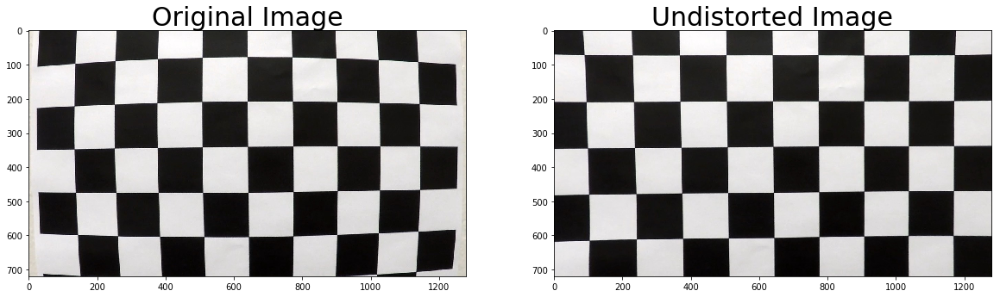

In [5]:
ORIGINAL_IMAGE = 'camera_cal/calibration1.jpg'
UNDISTORTED_IMAGE = 'output_images/calibration1_undistortion.jpg'

undistort(ORIGINAL_IMAGE, UNDISTORTED_IMAGE, save=True)

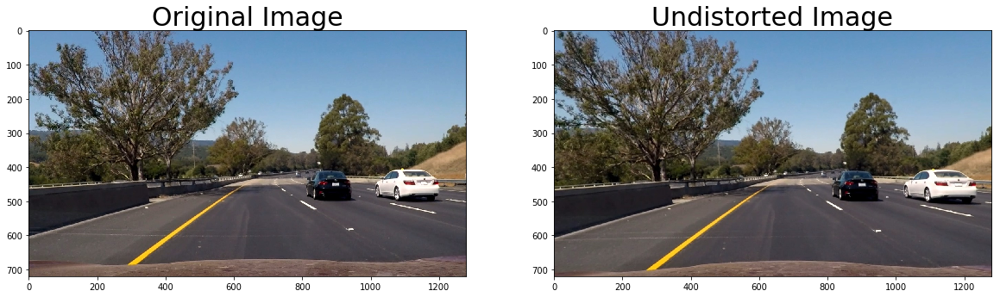

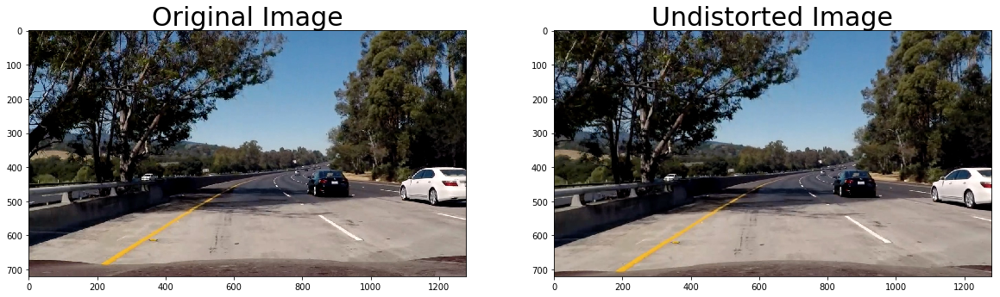

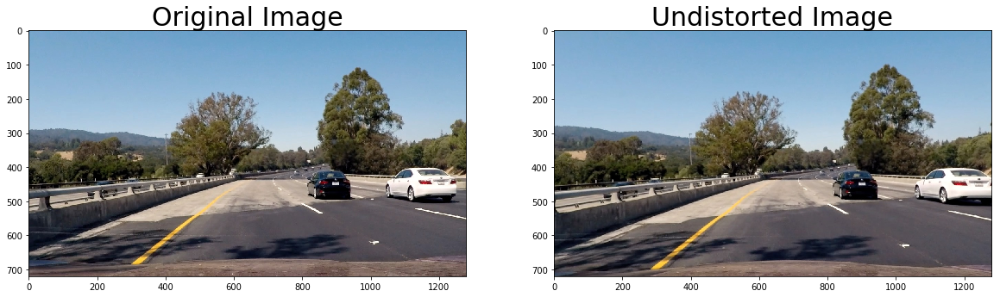

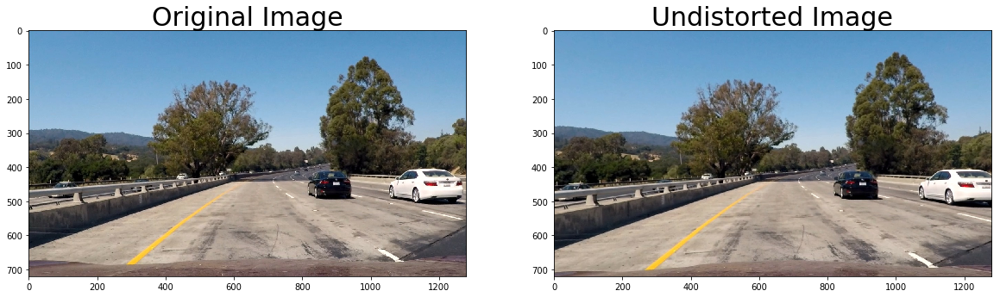

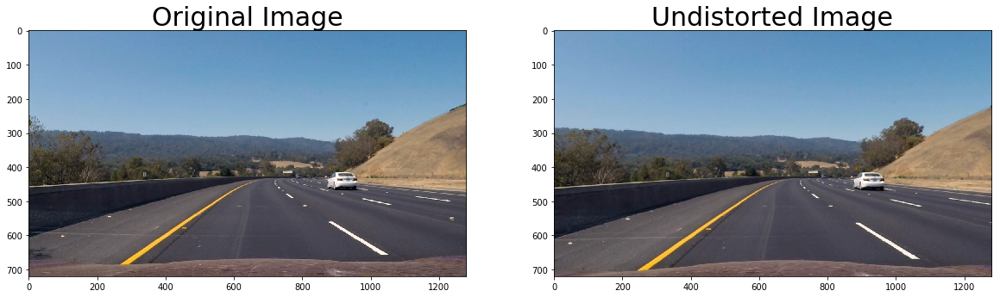

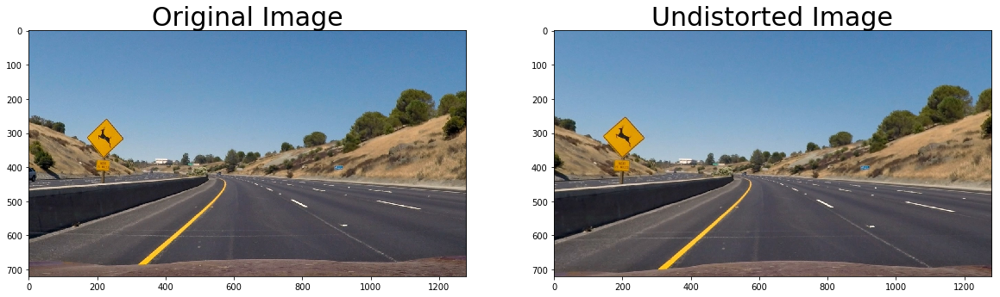

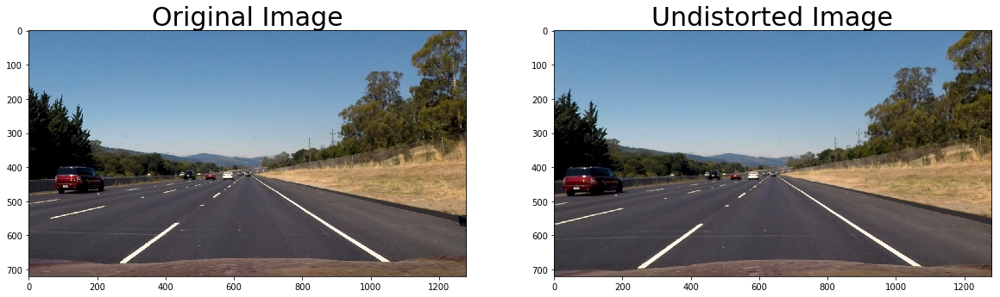

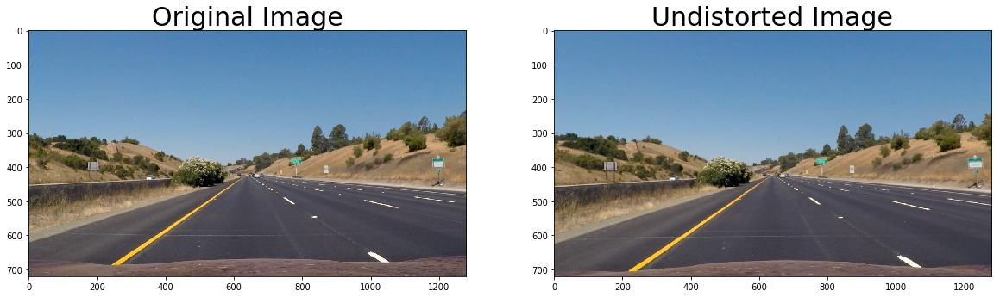

In [6]:
ORIGINAL_IMAGE = 'test_images/*.jpg'

images = glob.glob(ORIGINAL_IMAGE)
for fname in images:
    undistort(fname, fname.replace('test_images','output_images').replace('.jpg', '_undist.jpg'), save=True)

## Use color transforms, gradients, etc., to create a thresholded binary image.

### X/Y Gradient

In [7]:
def abs_sobel_thresh(gray, orient='x', sobel_kernel=3, thresh=(0, 255), show=True):

    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, sobel_kernel))
    
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    if show:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
        ax1.set_title('Undistorted image', fontsize=16)
        ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax2.set_title('Thresholded {} gradient'.format(orient), fontsize=16)
        ax2.imshow(binary_output,cmap='gray')
    
    # Return the result
    return binary_output

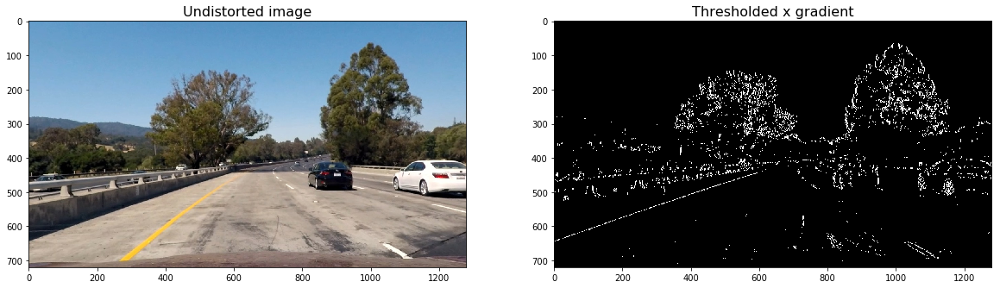

In [8]:
UNDISTORTED_IMAGE = 'output_images/test1_undist.jpg'
    
img = cv2.imread(UNDISTORTED_IMAGE)
# Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

x_grad = abs_sobel_thresh(gray, orient='x', sobel_kernel=15, thresh=(30, 100))

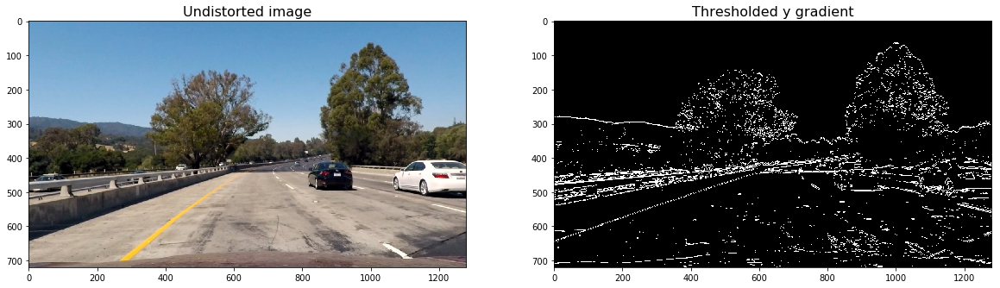

In [9]:
UNDISTORTED_IMAGE = 'output_images/test1_undist.jpg'

img = cv2.imread(UNDISTORTED_IMAGE)
# Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
y_grad = abs_sobel_thresh(gray, orient='y', sobel_kernel=15, thresh=(30, 100))

### Magnitude of the Gradient

In [10]:
def mag_thresh(gray, sobel_kernel=3, mag_thresh=(0, 255), show=True):
    
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    if show:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
        ax1.set_title('Undistorted image', fontsize=16)
        ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax2.set_title('Thresholded magnitude gradient', fontsize=16)
        ax2.imshow(binary_output,cmap='gray')
        
    # Return the binary image
    return binary_output

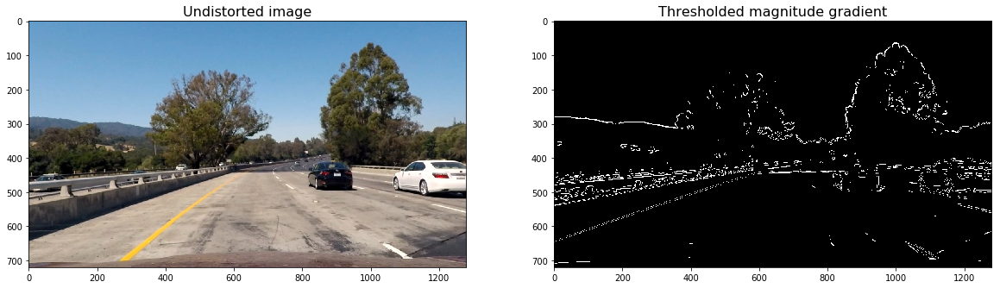

In [11]:
UNDISTORTED_IMAGE = 'output_images/test1_undist.jpg'

img = cv2.imread(UNDISTORTED_IMAGE)
# Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

mag_grad = mag_thresh(gray, sobel_kernel=15, mag_thresh=(70, 100))

### Direction of the Gradient

In [12]:
def dir_threshold(gray, sobel_kernel=3, thresh=(0, np.pi/2), show=True):
    
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    if show:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
        ax1.set_title('Undistorted image', fontsize=16)
        ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax2.set_title('Thresholded direction gradient', fontsize=16)
        ax2.imshow(binary_output,cmap='gray')
        
    # Return the binary image
    return binary_output

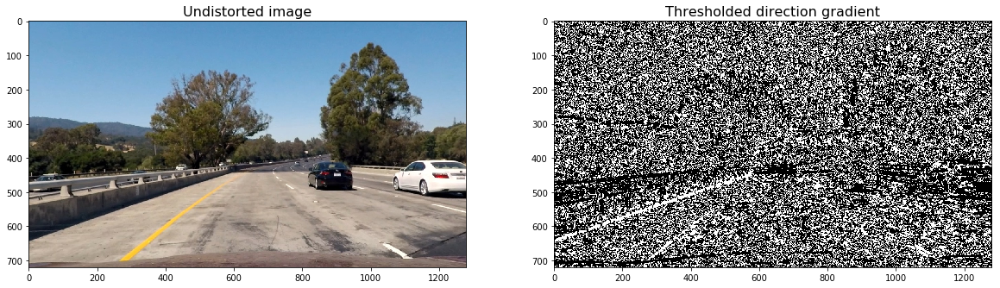

In [13]:
UNDISTORTED_IMAGE = 'output_images/test1_undist.jpg'

img = cv2.imread(UNDISTORTED_IMAGE)
# Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

dir_grad = dir_threshold(gray, sobel_kernel=15, thresh=(0.7, 1.3))

### Color threshold - S channel

In [14]:
def hls_select(img, thresh=(0, 255), show=True):
    
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    
    # Select S channel because it is usually the best performant
    # for this task. R channel also performs similarly.
    s_channel = hls[:,:,2]
    
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    
    if show:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
        ax1.set_title('Undistorted image', fontsize=16)
        ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax2.set_title('Thresholded S channel', fontsize=16)
        ax2.imshow(binary_output,cmap='gray')
    
    return binary_output

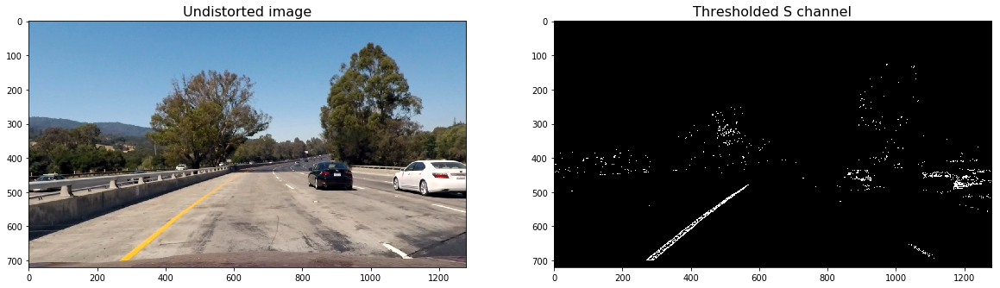

In [15]:
UNDISTORTED_IMAGE = 'output_images/test1_undist.jpg'

img = cv2.imread(UNDISTORTED_IMAGE)
hls_channel = hls_select(img, thresh=(170, 250))

### Combine all the thresholds to identify the lane lines

In [16]:
def combine_thresh(image, threshold_image='', ksize=15, show=True):

    img = cv2.imread(image)
    
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    x_grad = abs_sobel_thresh(gray, orient='x', sobel_kernel=15, thresh=(30, 100), show=False)
    y_grad = abs_sobel_thresh(gray, orient='y', sobel_kernel=15, thresh=(30, 100), show=False)
    mag_grad = mag_thresh(gray, sobel_kernel=15, mag_thresh=(70, 100), show=False)
    dir_grad = dir_threshold(gray, sobel_kernel=15, thresh=(0.7, 1.3), show=False)
    hls_channel = hls_select(img, thresh=(170, 250), show=False)
    
    # Combine the previous thresholds
    combined = np.zeros_like(x_grad)
    combined[((x_grad == 1) & (y_grad == 1)) | ((mag_grad == 1) & (dir_grad == 1)) | (hls_channel == 1)] = 1
    
    if threshold_image != '':
        cv2.imwrite(threshold_image, combined*255)
    
    if show:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
        ax1.set_title('Undistorted image', fontsize=16)
        ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax2.set_title('Thresholded Combined', fontsize=16)
        ax2.imshow(combined,cmap='gray')

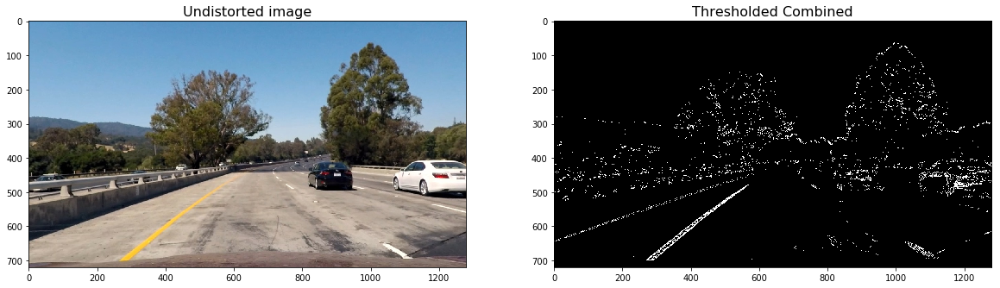

In [17]:
UNDISTORTED_IMAGE = 'output_images/test1_undist.jpg'

combine_thresh(UNDISTORTED_IMAGE)

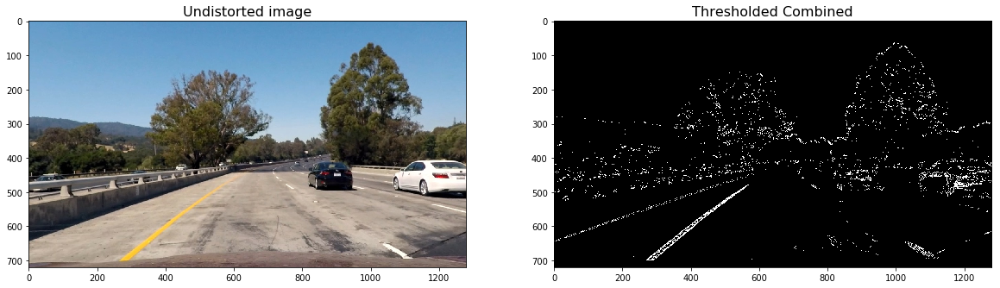

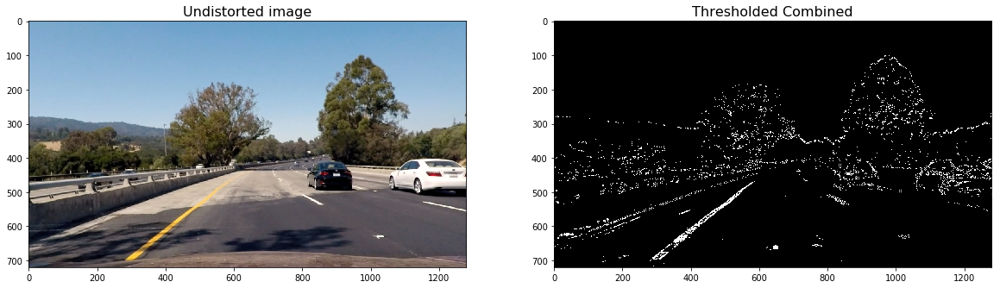

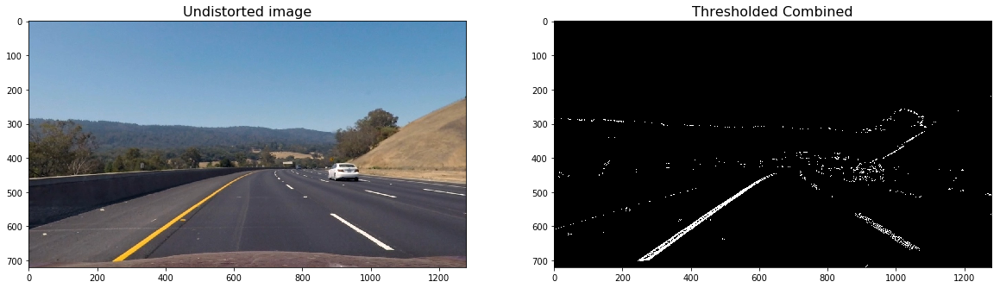

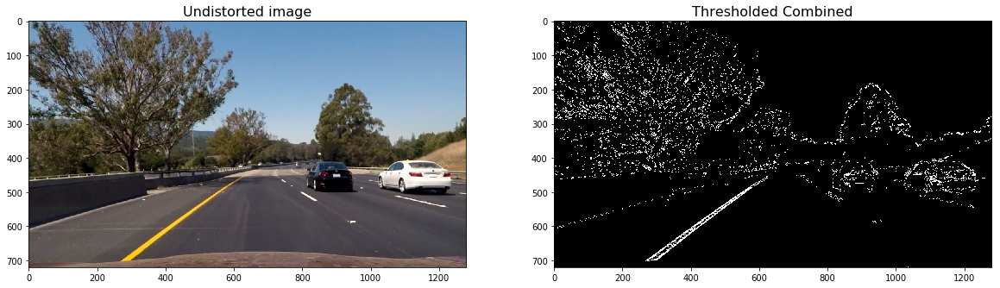

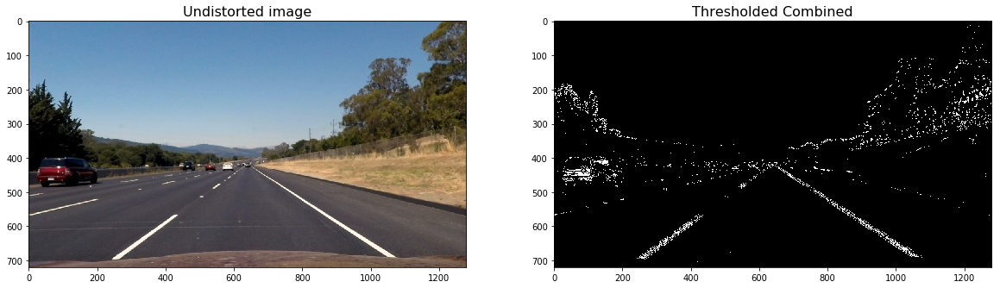

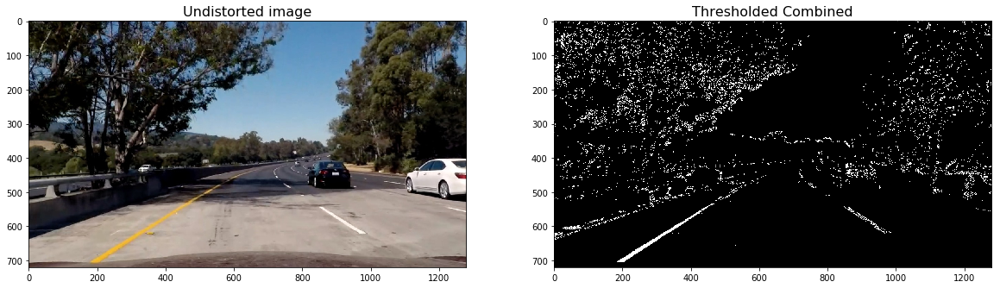

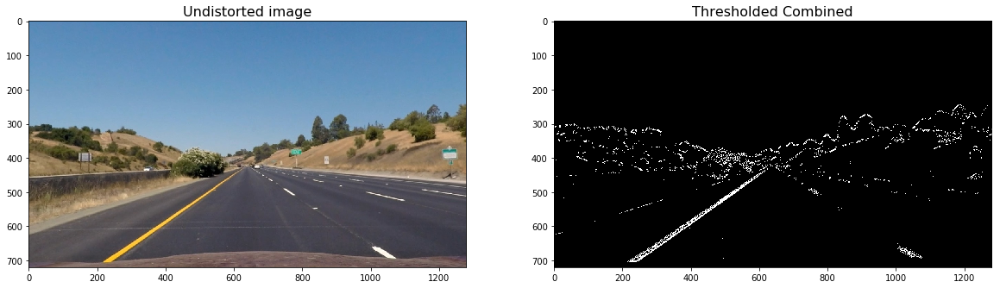

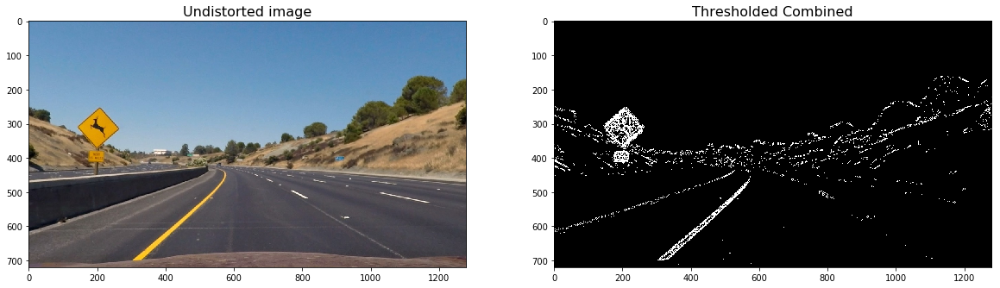

In [18]:
UNDISTORTED_IMAGE = 'output_images/*_undist.jpg'

images = glob.glob(UNDISTORTED_IMAGE)
for fname in images:
    combine_thresh(fname, fname.replace('_undist.jpg', '_thresh.jpg'))
    

## Apply a perspective transform to rectify binary image ("birds-eye view").

In [19]:
def perspective_transform(image, perspective_image='', src=None, dst=None, show=True):
    
    img = cv2.imread(image)
    
    # Define calibration box in source (original) and destination (desired or warped) coordinates
    img_size = (img.shape[1], img.shape[0])
    
    if src is None:
        src = np.float32(
            [[280,  700],  # Bottom left
             [595,  460],  # Top left
             [725,  460],  # Top right
             [1125, 700]]) # Bottom right
        
    if dst is None:
        dst = np.float32(
            [[250,  720],  # Bottom left
             [250,    0],  # Top left
             [1065,   0],  # Top right
             [1065, 720]]) # Bottom right   

    # Compute the perspective transfor, M
    M = cv2.getPerspectiveTransform(src, dst)

    
    # Compute the inverse perspective transfor also by swapping the input parameters
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    # Create warped image - uses linear interpolation
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
    if perspective_image != '':
        cv2.imwrite(perspective_image, warped*255)
    
    if show:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
        ax1.set_title('Thresholded image', fontsize=16)
        ax1.plot(Polygon(src).get_xy()[:, 0], Polygon(src).get_xy()[:, 1], color='red')
        ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax2.set_title('Perspective transform', fontsize=16)
        ax2.plot(Polygon(dst).get_xy()[:, 0], Polygon(dst).get_xy()[:, 1], color='red')
        ax2.imshow(warped)
    

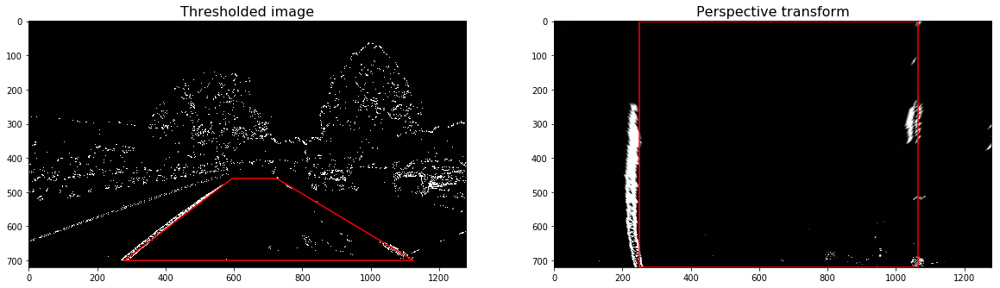

In [20]:
THRESHOLDED_IMAGE = 'output_images/test1_thresh.jpg'

perspective_transform(THRESHOLDED_IMAGE)

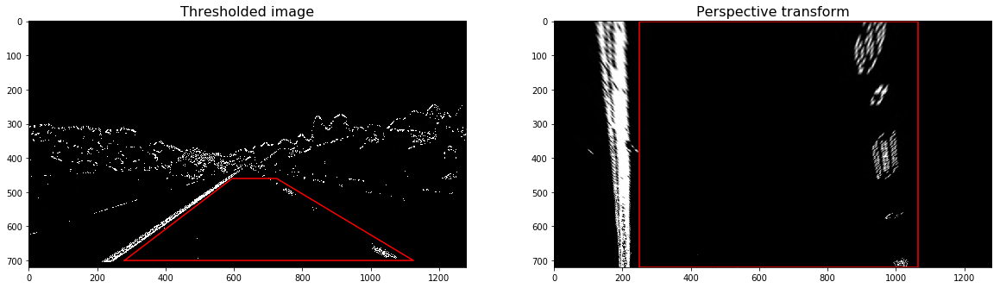

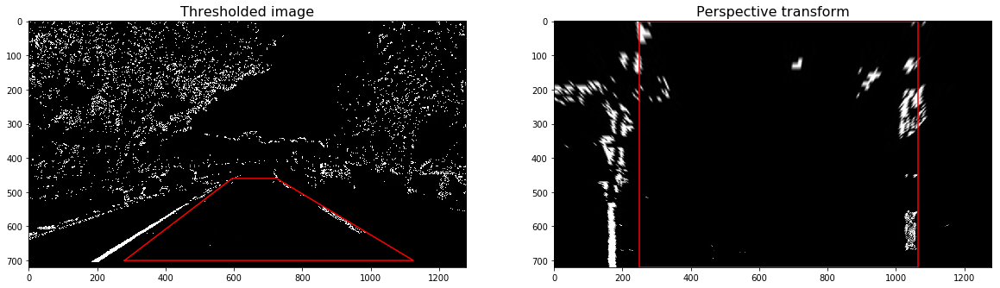

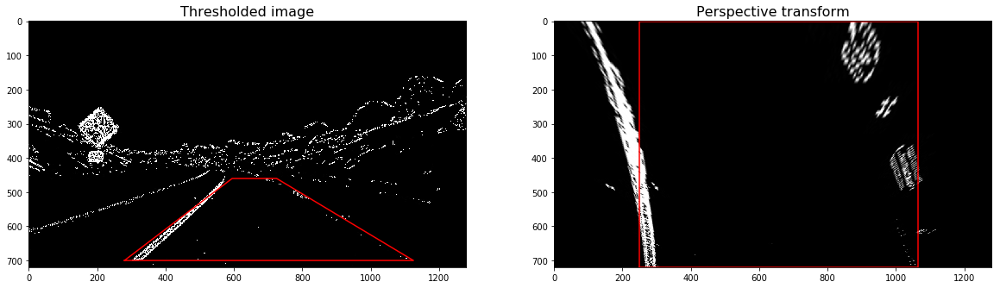

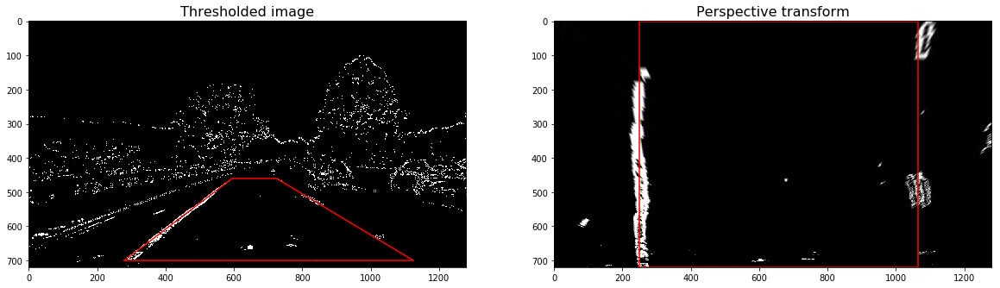

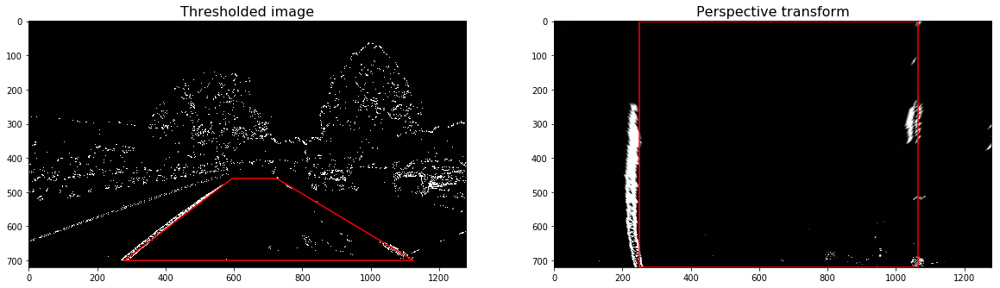

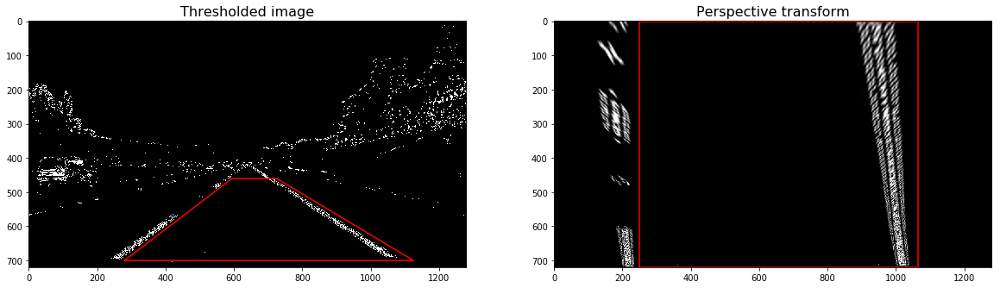

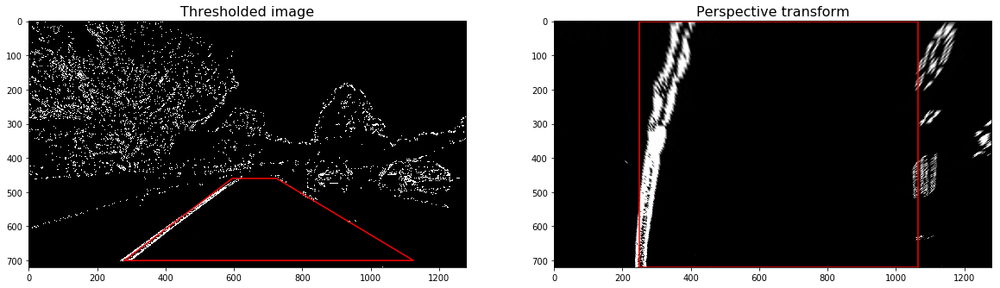

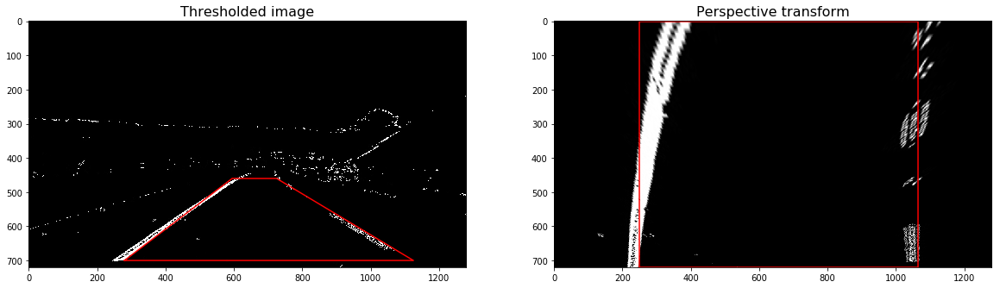

In [21]:
THRESHOLDED_IMAGE = 'output_images/*_thresh.jpg'

images = glob.glob(THRESHOLDED_IMAGE)
for fname in images:
    perspective_transform(fname, fname.replace('_thresh.jpg', '_persp.jpg'))
    

## Detect lane pixels and fit to find the lane boundary.

In [22]:
def hist(image, show=True):
    
    # Grab only the bottom half of the image
    # Lane lines are likely to be mostly vertical nearest to the car
    bottom_half = image[image.shape[0]//2:,:]

    # Sum across image pixels vertically - make sure to set an `axis`
    # i.e. the highest areas of vertical lines should be larger values
    histogram = np.sum(bottom_half, axis=0)
    
    if show:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
        ax1.set_title('Perspective transformed image', fontsize=16)
        ax1.imshow(image, cmap='gray')
        ax2.set_title('Histogram', fontsize=16)
        ax2.plot(histogram)
        
    return histogram
    

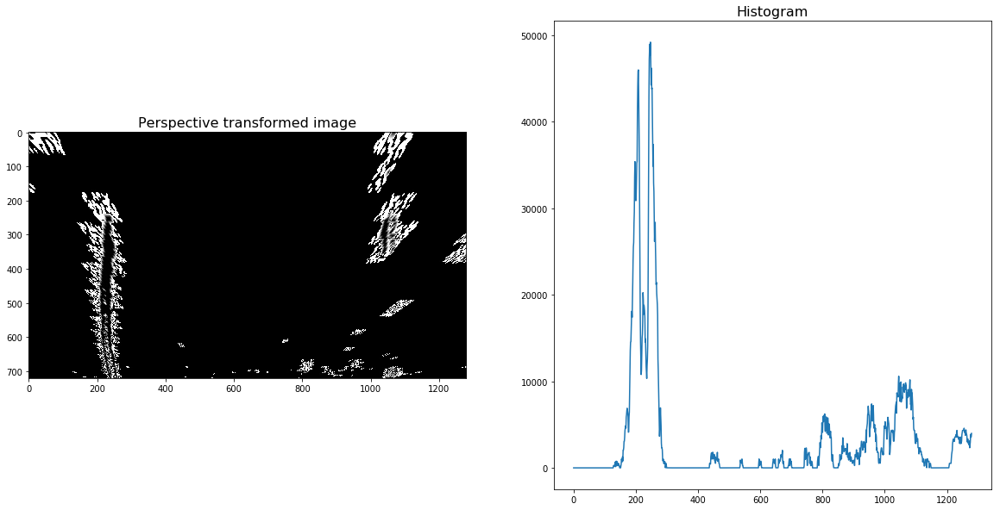

In [23]:
PERSPECTIVE_IMAGE = 'output_images/test1_persp.jpg'

gray = cv2.imread(PERSPECTIVE_IMAGE, cv2.IMREAD_GRAYSCALE)
histogram = hist(gray)

In [24]:
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = hist(binary_warped, show=False)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_polynomial(binary_warped, ym_per_pix=1, xm_per_pix=1, show=True):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    if show:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
        ax1.set_title('Perspective transformed image', fontsize=16)
        ax1.imshow(binary_warped, cmap='gray')
        ax2.set_title('Fit a Polynomial', fontsize=16)
        # Plots the left and right polynomials on the lane lines
        ax2.plot(left_fitx, ploty, color='yellow')
        ax2.plot(right_fitx, ploty, color='yellow')
        ax2.imshow(out_img)
    
    return left_fit, right_fit, ploty, leftx, lefty, rightx, righty
        

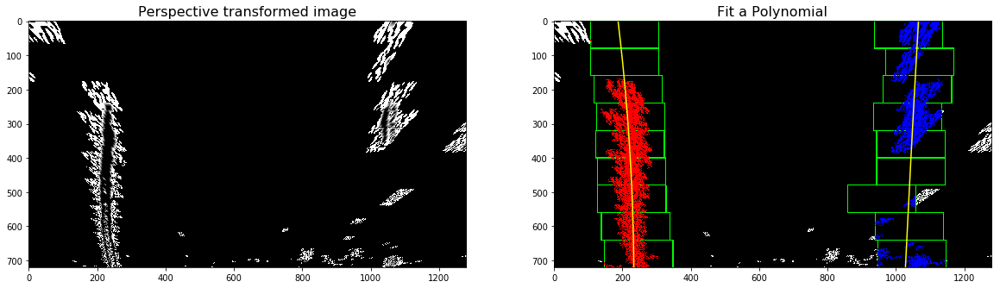

In [25]:
PERSPECTIVE_IMAGE = 'output_images/test1_persp.jpg'

gray = cv2.imread(PERSPECTIVE_IMAGE, cv2.IMREAD_GRAYSCALE)
left_fit, right_fit, ploty, leftx, lefty, rightx, righty = fit_polynomial(gray)

In [26]:
def fit_poly(img_shape, leftx, lefty, rightx, righty):
     ### TO-DO: Fit a second order polynomial to each with np.polyfit() ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fitx, right_fitx, ploty

def search_around_poly(binary_warped, left_fit, right_fit, lane_image='',show=True):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### TO-DO: Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    if show:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
        ax1.set_title('Perspective transformed image', fontsize=16)
        ax1.imshow(binary_warped, cmap='gray')
        ax2.set_title('Detected lane lines', fontsize=16)
        # Plots the left and right polynomials on the lane lines
        ax2.plot(left_fitx, ploty, color='yellow')
        ax2.plot(right_fitx, ploty, color='yellow')
        ax2.imshow(result)
        if lane_image != '':
            # Save just the portion _inside_ the second axis's boundaries
            extent = ax2.get_window_extent().transformed(f.dpi_scale_trans.inverted())
            f.savefig(lane_image, bbox_inches=extent)


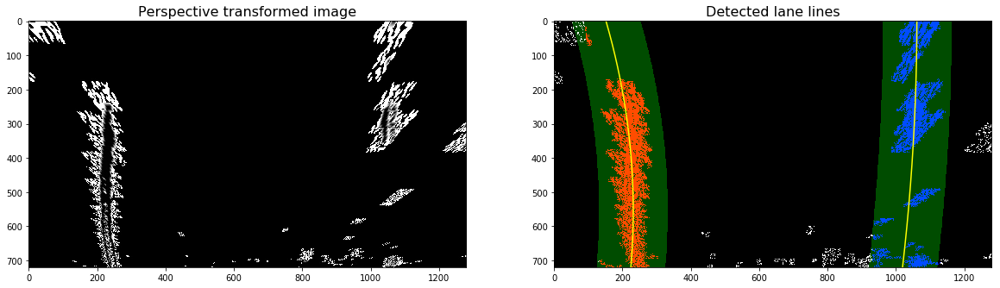

In [31]:
PERSPECTIVE_IMAGE = 'output_images/test1_persp.jpg'

gray = cv2.imread(PERSPECTIVE_IMAGE, cv2.IMREAD_GRAYSCALE)
search_around_poly(gray, left_fit, right_fit)

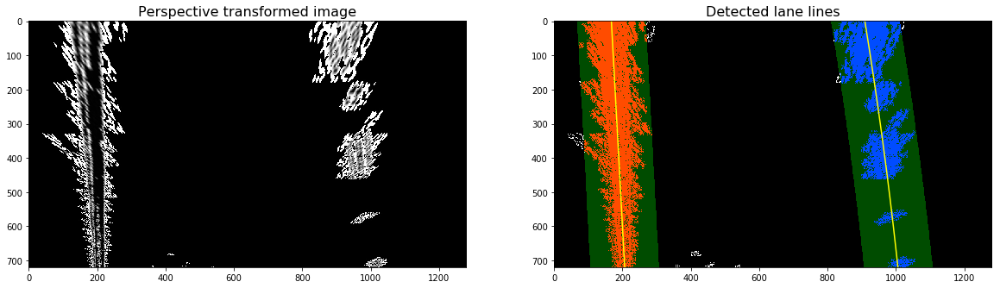

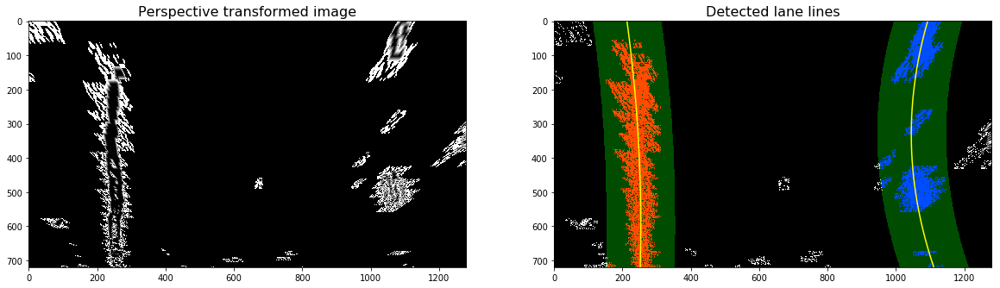

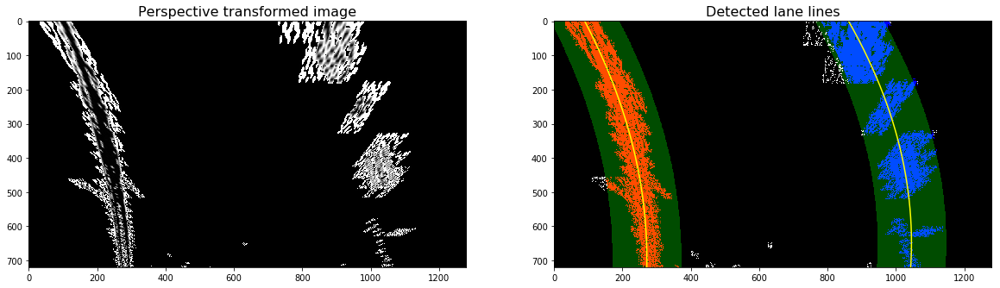

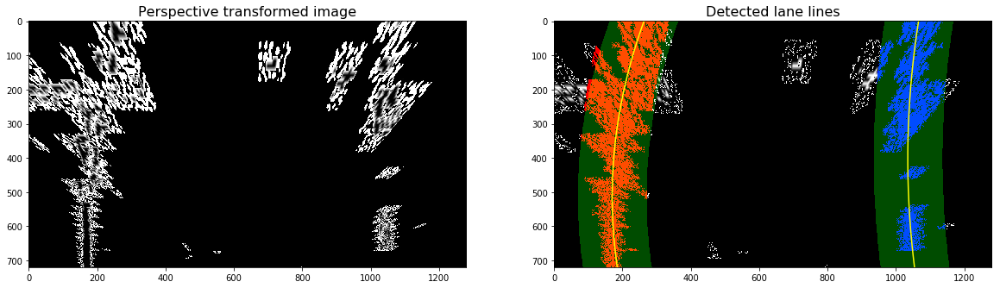

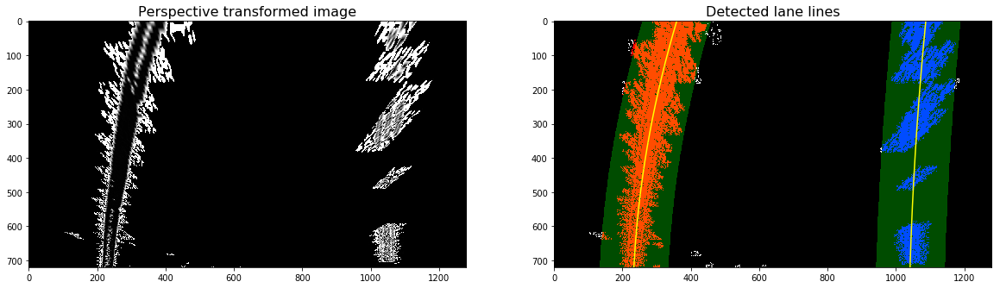

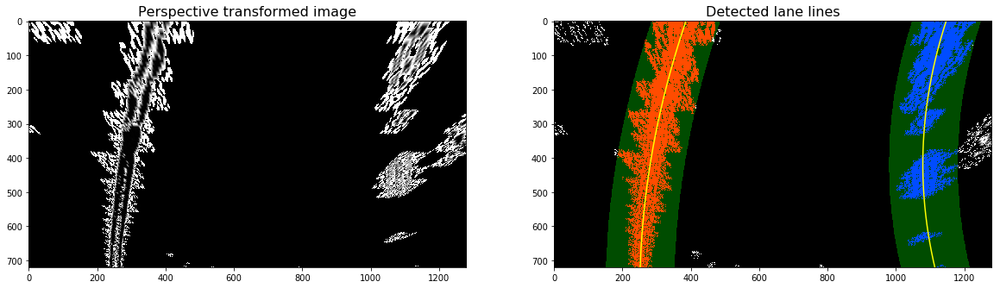

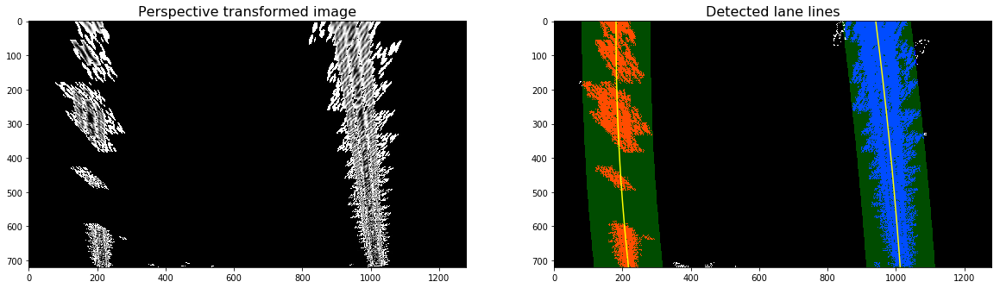

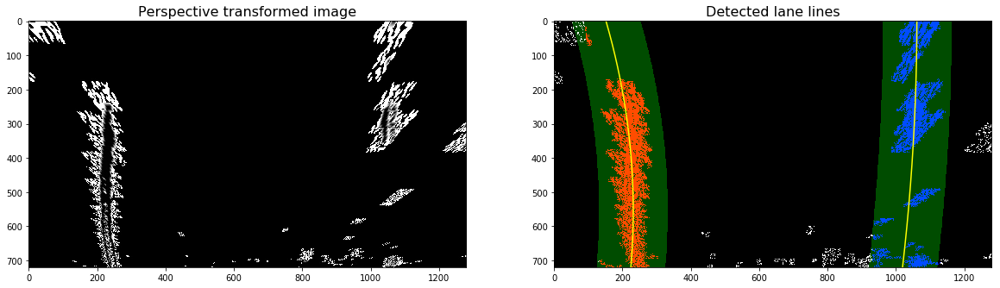

In [32]:
PERSPECTIVE_IMAGE = 'output_images/*_persp.jpg'

images = glob.glob(PERSPECTIVE_IMAGE)
for fname in images:
    gray = cv2.imread(fname, cv2.IMREAD_GRAYSCALE)
    left_fit, right_fit, ploty, leftx, lefty, rightx, righty = fit_polynomial(gray, show=False)
    search_around_poly(gray, left_fit, right_fit, fname.replace('_persp.jpg', '_lane.jpg'))

## Determine the curvature of the lane and vehicle position with respect to center.

In [29]:
def measure_curvature_real(gray):
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Start by generating our fake example data
    # Make sure to feed in your real data instead in your project!
    
    left_fit_cr, right_fit_cr, ploty, leftx, lefty, rightx, righty = fit_polynomial(gray, ym_per_pix, xm_per_pix, show=True)
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    ## Image mid horizontal position 
    mid_imgx = gray.shape[1]//2
    
    ## Car position with respect to the lane
    car_pos = (leftx[-1] + rightx[-1])/2
    
    center_offset = (mid_imgx - car_pos) * xm_per_pix
    
    return left_curverad, right_curverad, center_offset


Left line curvature: 2100.572155984815 m
Right line curvature: 24971.00024994517 m
Car offset from center: 0.22728571428571429 m.


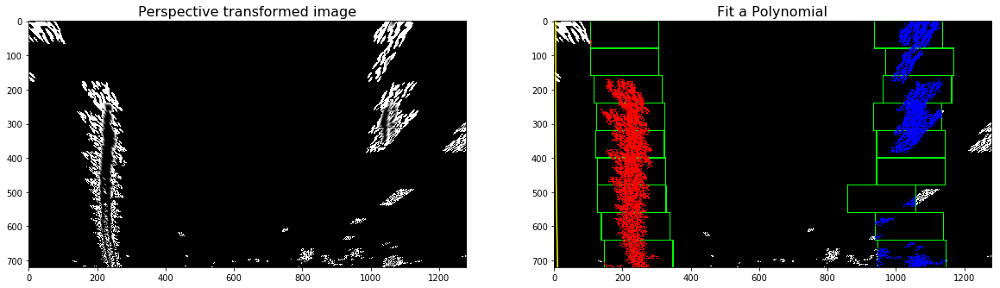

In [30]:
PERSPECTIVE_IMAGE = 'output_images/test1_persp.jpg'

gray = cv2.imread(PERSPECTIVE_IMAGE, cv2.IMREAD_GRAYSCALE)

left_curverad, right_curverad, center_offset = measure_curvature_real(gray)
print('Left line curvature:', left_curverad, 'm')
print('Right line curvature:', right_curverad, 'm')
print ('Car offset from center:', center_offset, 'm.')

## Warp the detected lane boundaries back onto the original image.

## Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.